In [2]:
import json
import math
import os
import random
from typing import Callable, Tuple
from IPython.display import display

import augly.image as imaugs
import pandas as pd
import timm
import torch
from PIL import Image
from torchvision import models, transforms
from torchvision.utils import save_image

In [3]:
base_dir = "/checkpoint/zoep/imagenet_analysis"
imagenet_val_data_table_path = (
    "/checkpoint/zoep/imagenet_analysis/imagenet_val_data_table.json"
)
dataset_dirs = {
    "imagenet_val": os.path.join(base_dir, "imagenet_val"),
    "imagenet_v2": os.path.join(
        base_dir, "imagenetv2-matched-frequency-format-val"
    )
}
aug_images_dirs = {
    "imagenet_val": os.path.join(base_dir, "imagenet_val_aug"),
    "imagenet_v2": os.path.join(base_dir, "imagenet_v2_aug"),
}
batch_size = 20

# send model + inputs to diff devices
devices = [
    torch.device("cuda:0" if torch.cuda.is_available() else "cpu"),
    torch.device("cuda:1" if torch.cuda.is_available() else "cpu"),
]

In [16]:
base_transforms = [
    lambda path: Image.open(path),
    lambda image: image.convert(mode="RGB"),
    transforms.Resize(800),
    transforms.CenterCrop(800),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
]

augmentations = {
    "blur": imaugs.Blur(radius=3),
    "random_noise": imaugs.RandomNoise(mean=0.1, var=0.2),
    "sharpen": imaugs.Sharpen(factor=10),
    "encoding_quality": imaugs.EncodingQuality(quality=15),
    "change_aspect_ratio": imaugs.ChangeAspectRatio(ratio=3.0),
    "opacity": imaugs.Opacity(level=0.5),
    "pixelization": imaugs.Pixelization(ratio=0.3),
    "scale": imaugs.Scale(factor=0.5),
    "color_jitter": imaugs.ColorJitter(
        brightness_factor=1.6,
        contrast_factor=1.6,
        saturation_factor=1.6,
    ),
    "hflip": imaugs.HFlip(),
    "perspective_transform": imaugs.PerspectiveTransform(),
    "rotate": imaugs.Rotate(degrees=50),
    "vflip": imaugs.VFlip(),
    "overlay_emoji": imaugs.OverlayEmoji(y_pos=0.3, emoji_size=0.8),
    "overlay_text": imaugs.OverlayText(font_size=0.5, x_pos=0.2, y_pos=0.1),
    "overlay_stripes": imaugs.OverlayStripes(
        line_angle=-30,
        line_density=0.9,
        line_width=0.4,
        line_type="dashed",
    ),
    "meme_format": imaugs.MemeFormat(),
}

In [18]:
def sample_images(test_set_dir, data_table_path=None):
    if data_table_path is not None:
        with open(data_table_path) as data_table_file:
            data_table = json.load(data_table_file)
            
        df = pd.DataFrame(data_table["data"])
        df.columns = ["filepath", "class", "class_name"]
        df["filepath"] = df["filepath"].apply(
            lambda path: os.path.basename(os.path.dirname(path))
        )
        df = df.drop_duplicates()
        class_dir_to_id = dict(
            zip(df["filepath"], [str(c) for c in df["class"]]),
        )
        
    sampled_test_images = []
    image_path_to_class_id = {}
    class_id_to_image_paths = {}
    for class_id in os.listdir(test_set_dir):
        class_dir = os.path.join(test_set_dir, class_id)
        if data_table_path is not None:
            class_id = class_dir_to_id[class_id]
        image_paths = os.listdir(class_dir)

        sampled_images = random.sample(image_paths, k=2)
        sampled_test_images.extend(
            [os.path.join(class_dir, image) for image in sampled_images]
        )
        image_path_to_class_id.update(
            {path : class_id for path in sampled_test_images[-2:]}
        )
        class_id_to_image_paths[int(class_id)] = sampled_test_images[-2:]
        
    sampled_test_images = random.sample(sampled_test_images, k=250)
    return sampled_test_images, image_path_to_class_id, class_id_to_image_paths


def augment_images(images, dataset, num_images=None):
    print(f"About to augment {len(images)} images using {len(augmentations.keys())} augmentations")
    aug_images_dir = aug_images_dirs[dataset]
    if not os.path.exists(aug_images_dir):
        os.mkdir(aug_images_dir)

    aug_images = {}
    for i, image in enumerate(images):
        if num_images is not None and i >= num_images:
            return aug_images
        
        if (i + 1) % 50 == 0:
            print(f"Augmented {i + 1}/{len(images)} images")
            
        aug_images_dict = {}
        for aug_name, aug in augmentations.items():
            aug_fp = os.path.join(
                aug_images_dir,
                f"{image.split('/')[-1].split('.')[0]}_{aug_name}.png",
            )
            aug_images_dict[aug_name] = aug_fp
            if os.path.exists(aug_fp) and aug_name != "blur":
                continue
                
            eval_transform = transforms.Compose(
                base_transforms[:1] + [aug] + base_transforms[1:]
            )
            save_image(eval_transform(image), aug_fp)
        aug_images[image] = aug_images_dict

    return aug_images

In [8]:
random.seed(1245)
sampled_images = {
    "imagenet_val": sample_images(
        dataset_dirs["imagenet_val"], imagenet_val_data_table_path
    ),
    "imagenet_v2": sample_images(dataset_dirs["imagenet_v2"], None),
}

# Augmentations

Original image


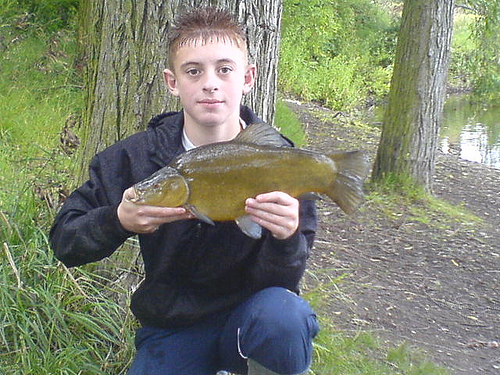

---------------
blur


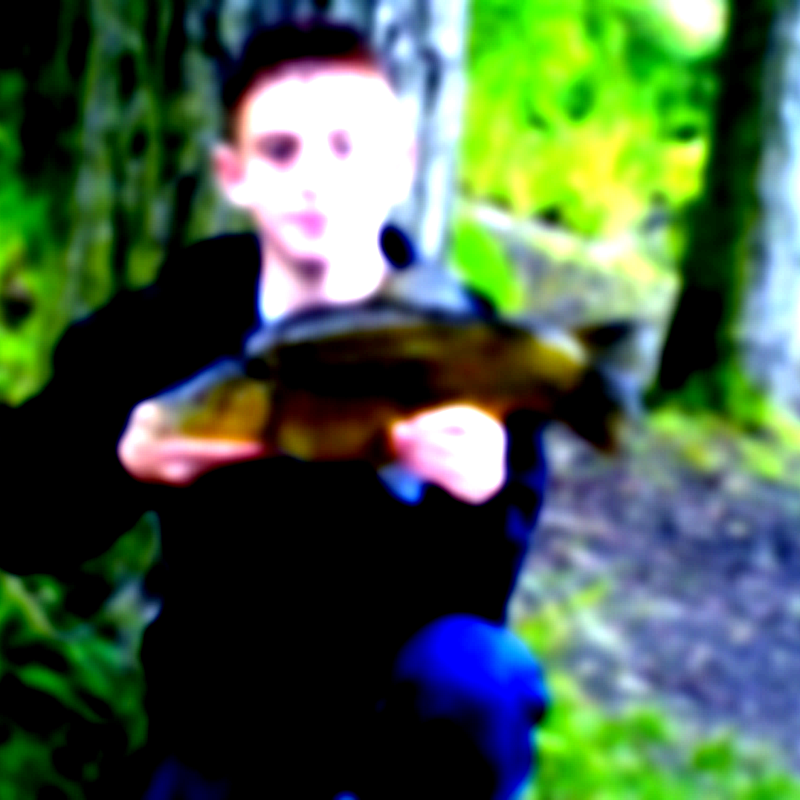

---------------
random_noise


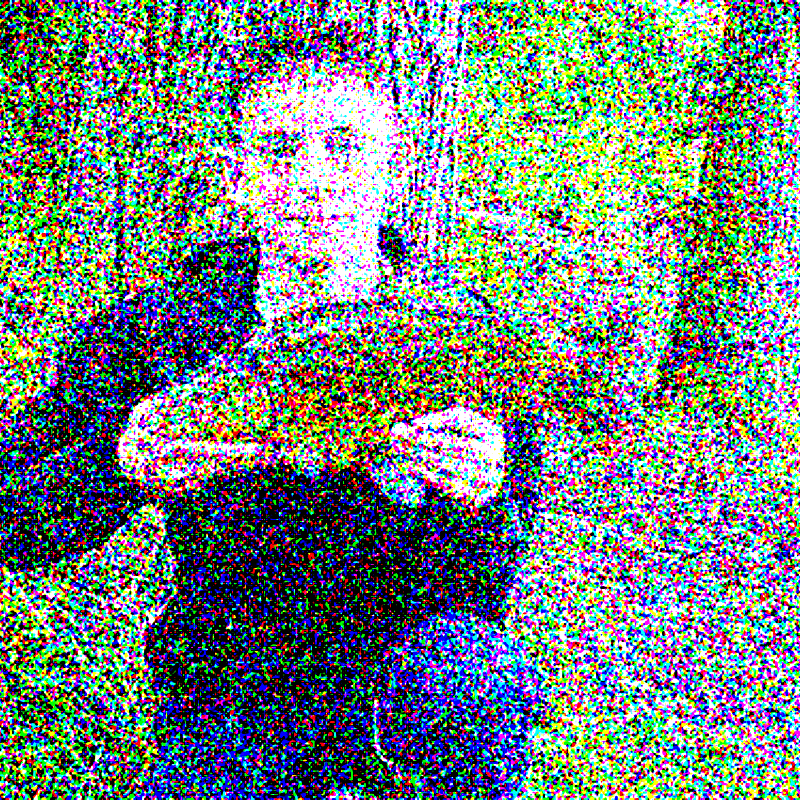

---------------
sharpen


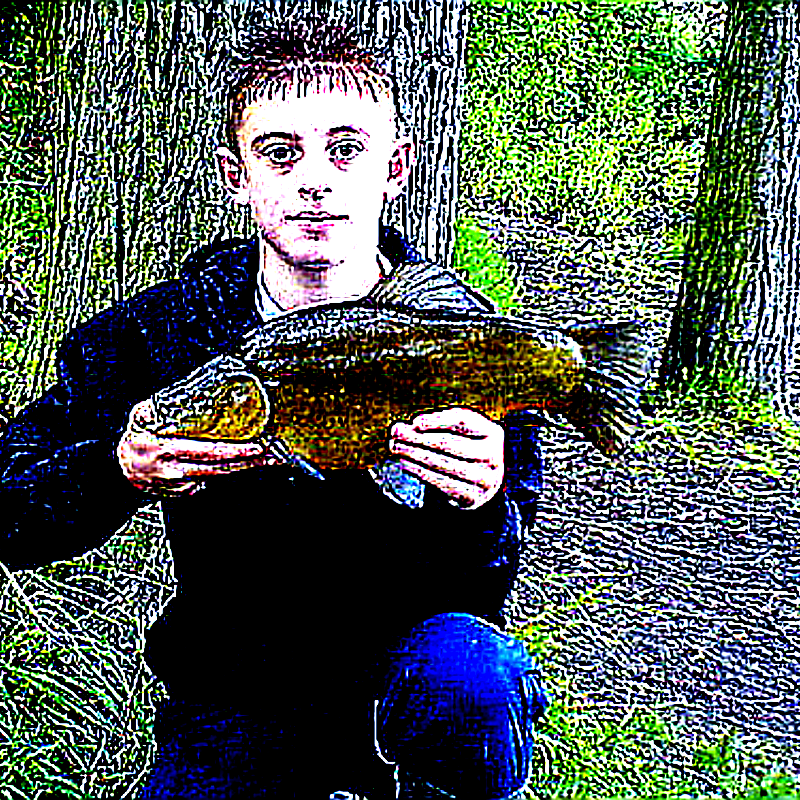

---------------
encoding_quality


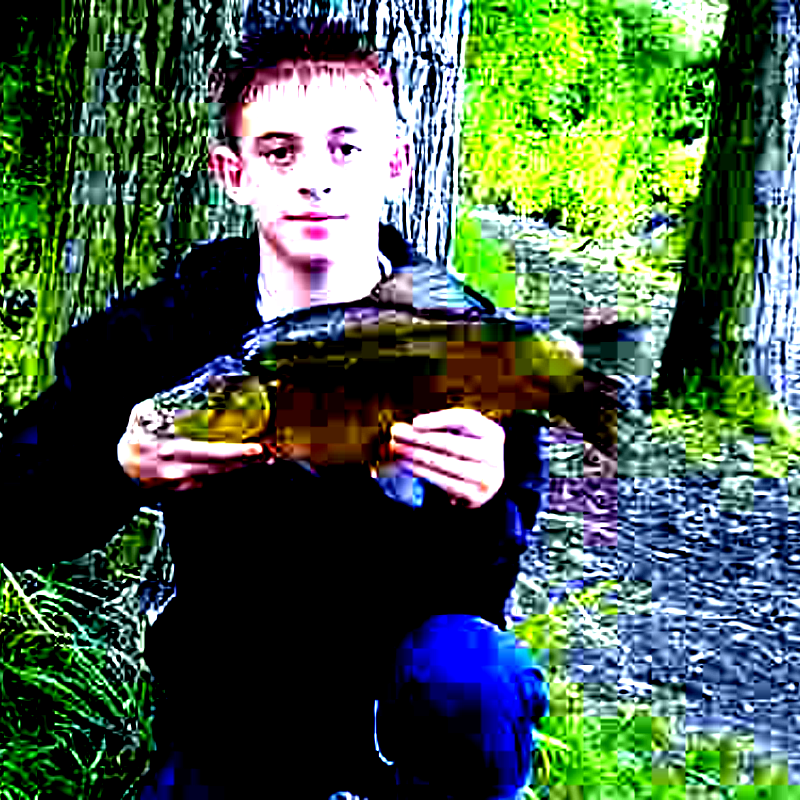

---------------
change_aspect_ratio


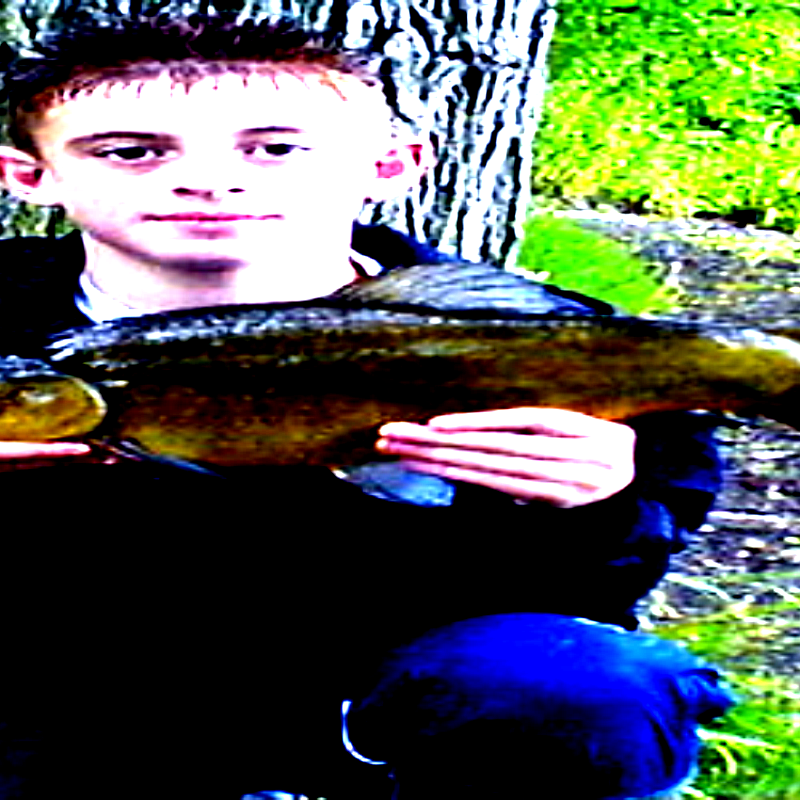

---------------
opacity


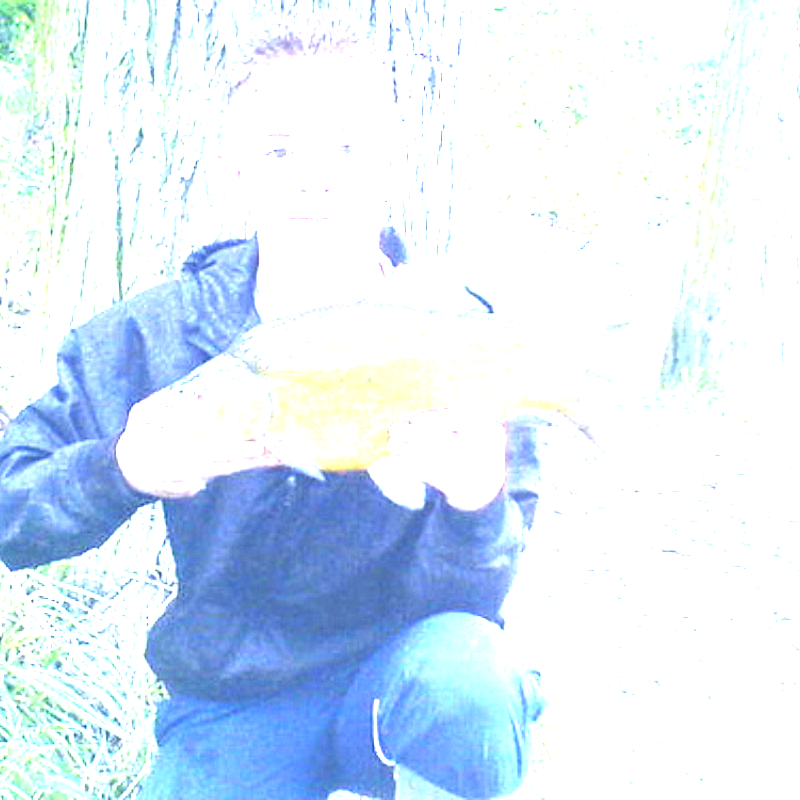

---------------
pixelization


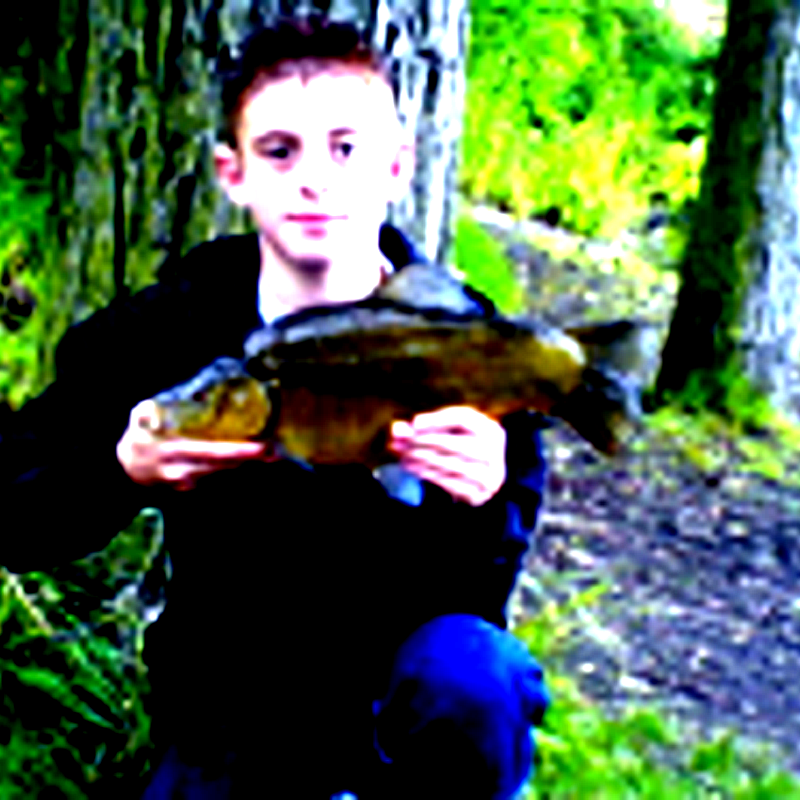

---------------
scale


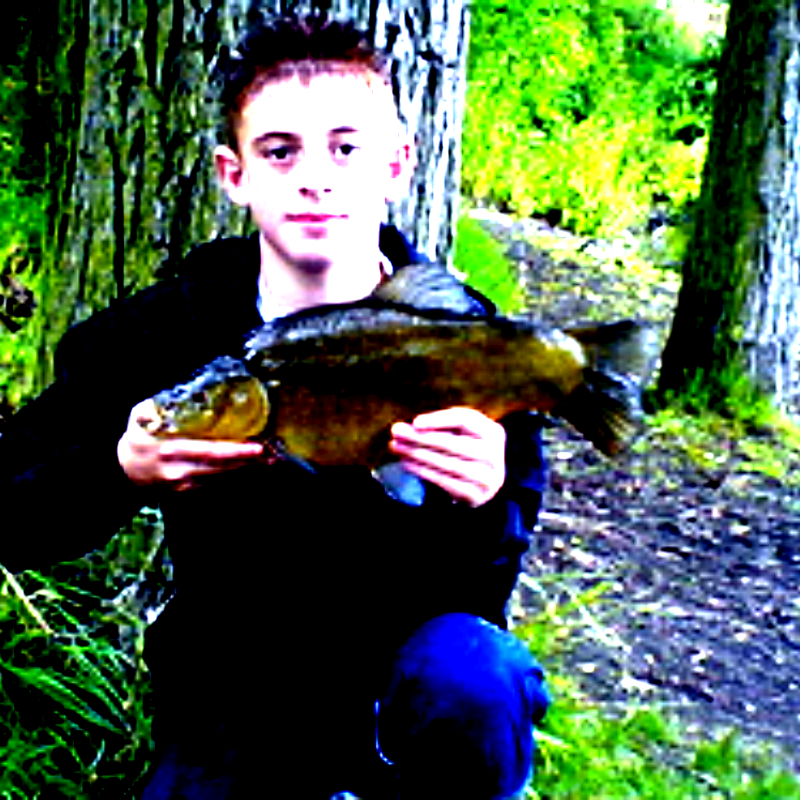

---------------
color_jitter


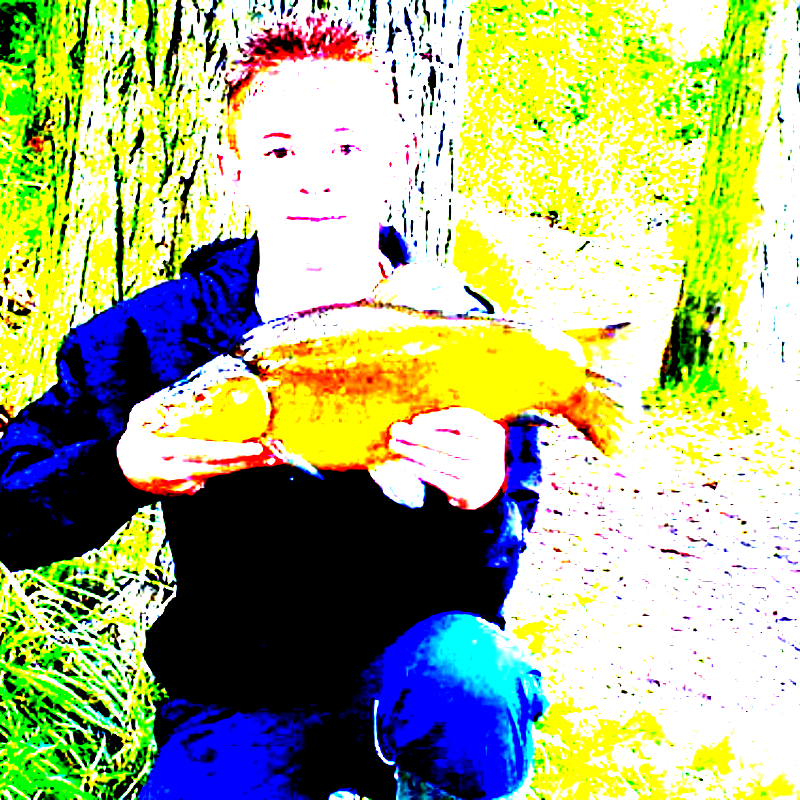

---------------
hflip


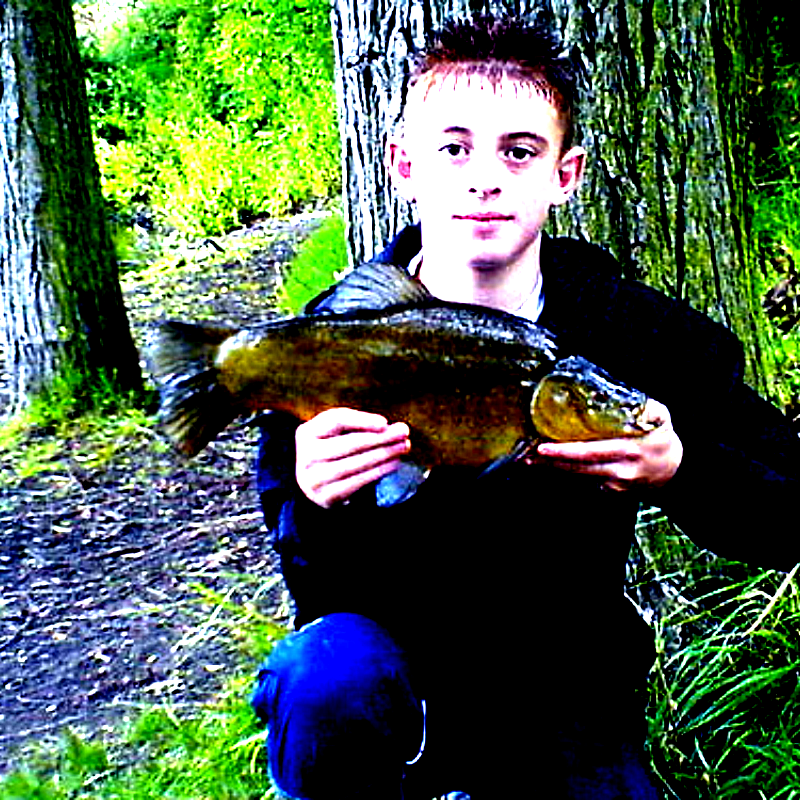

---------------
perspective_transform


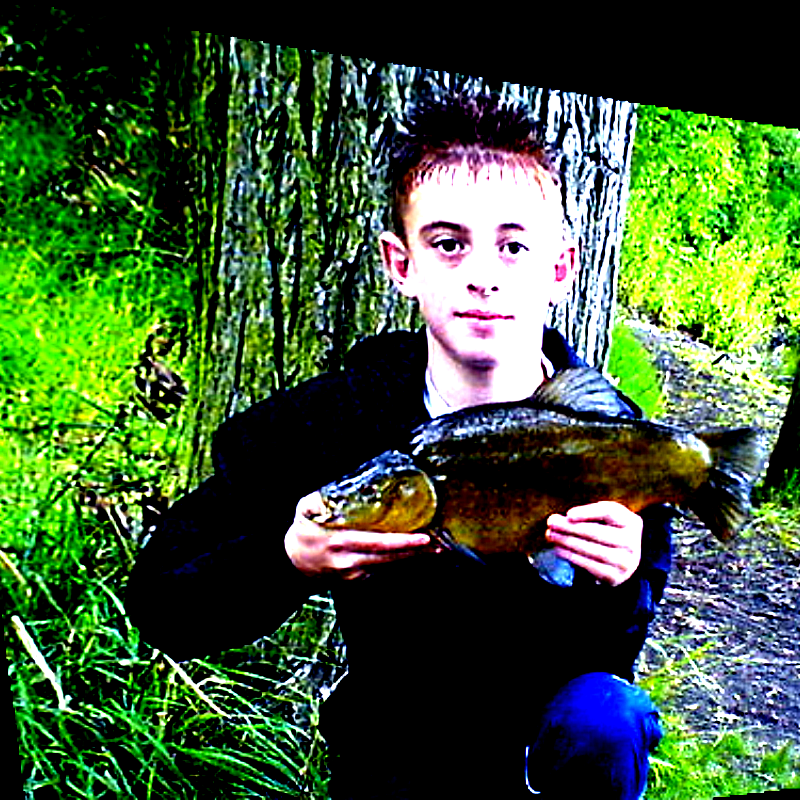

---------------
rotate


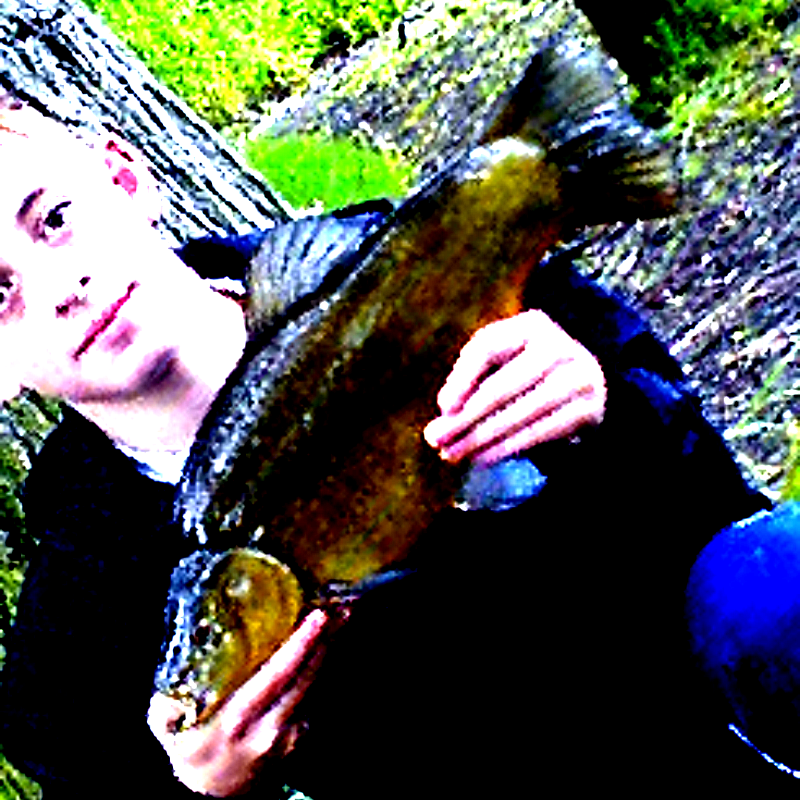

---------------
vflip


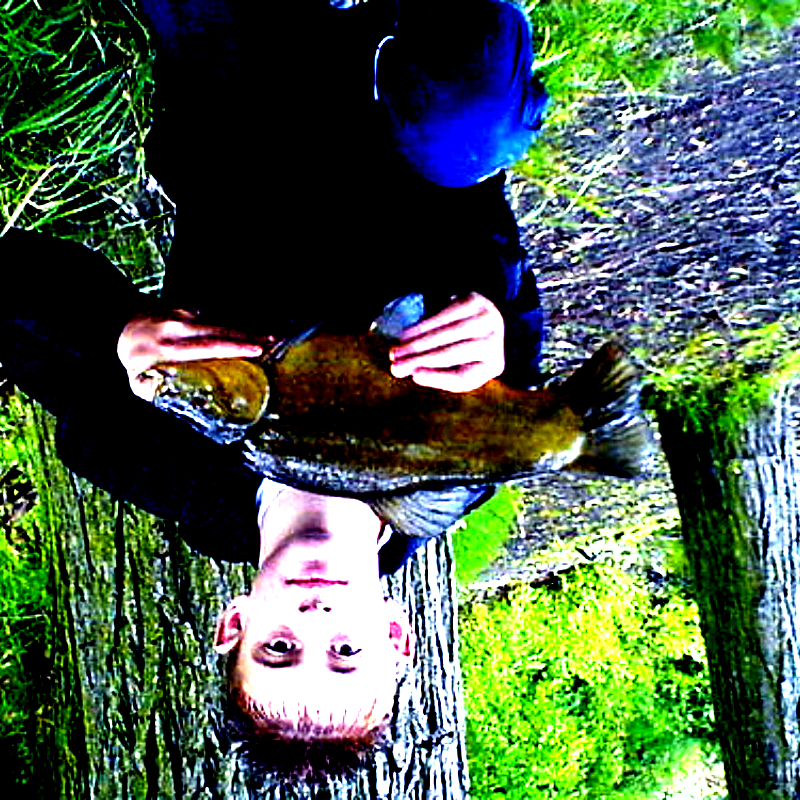

---------------
overlay_emoji


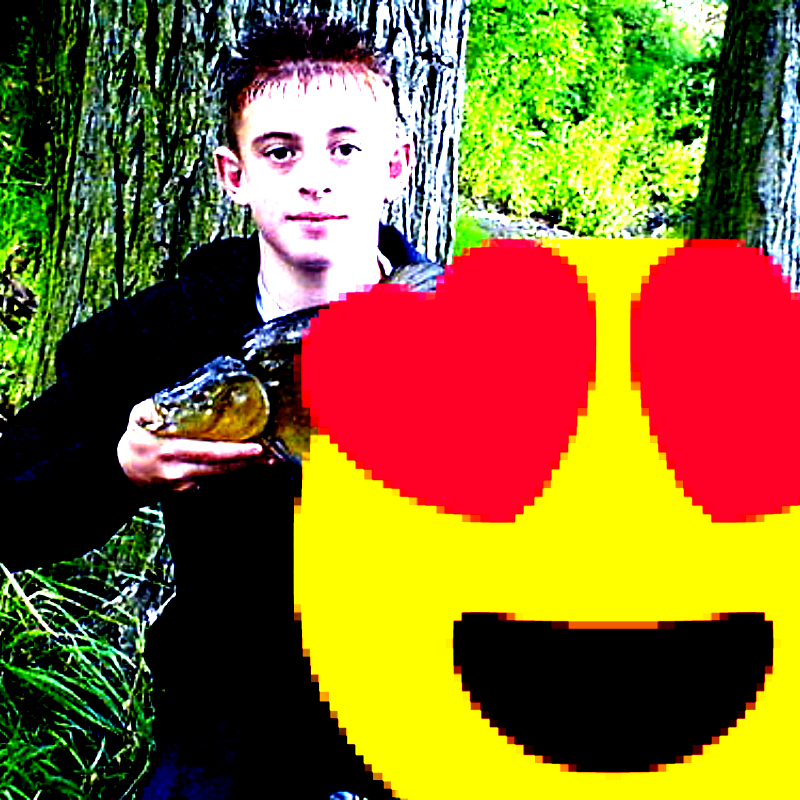

---------------
overlay_text


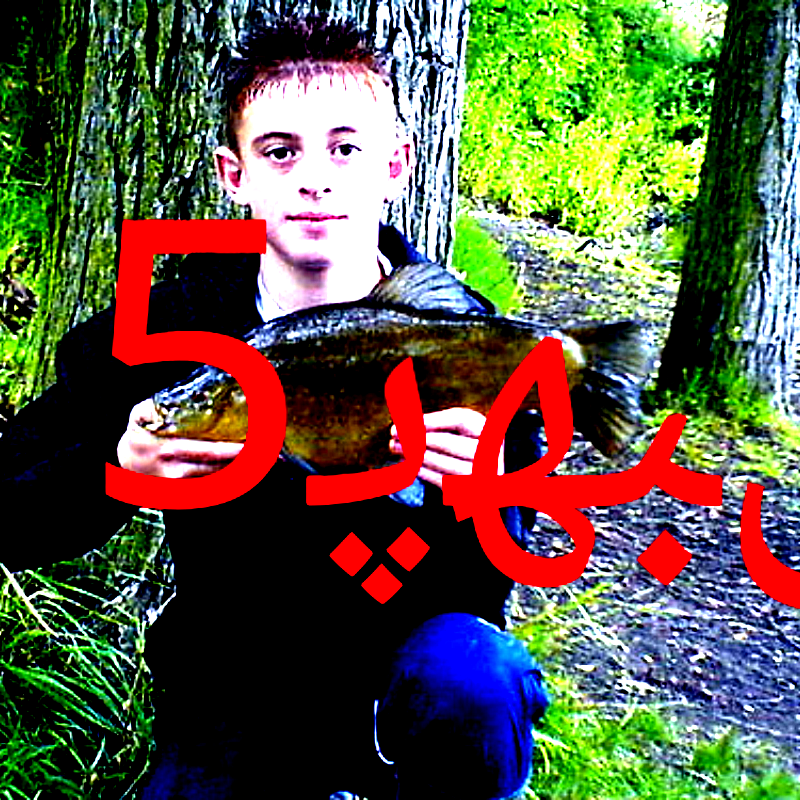

---------------
overlay_stripes


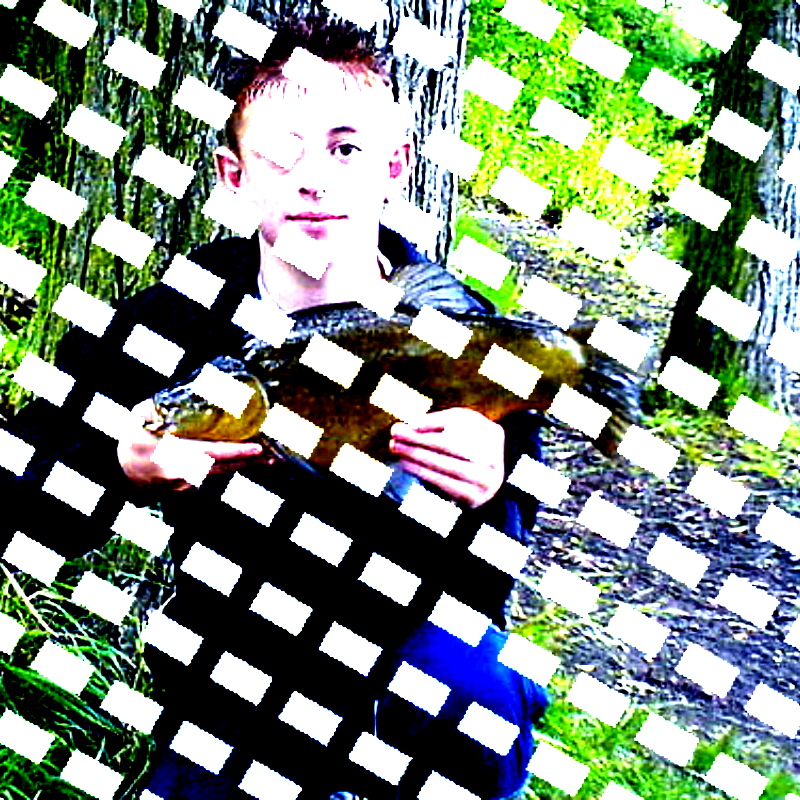

---------------
meme_format


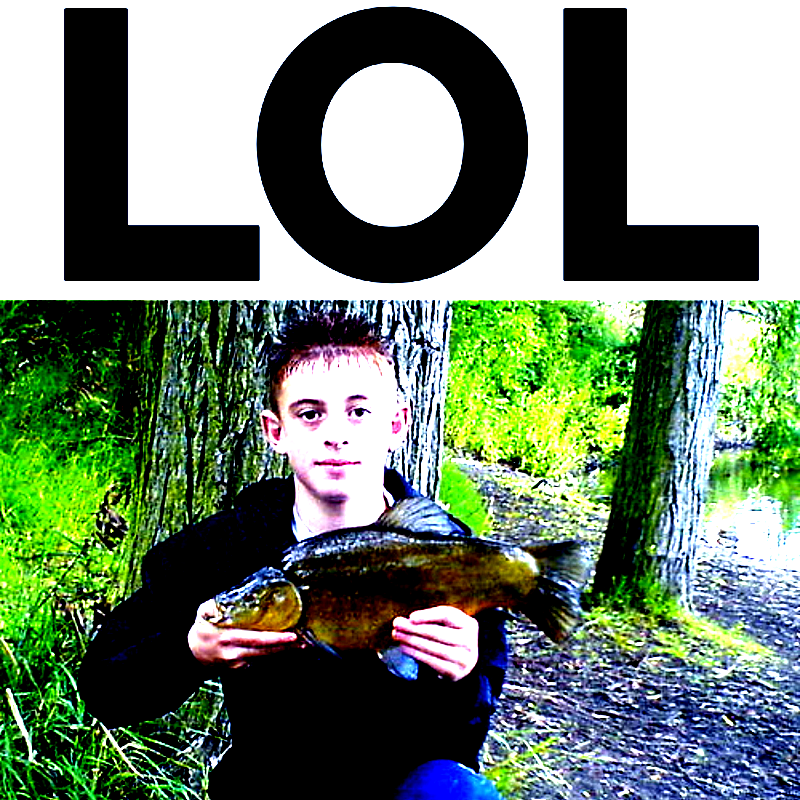

In [17]:
# We will now run all the following augmentations on the sampled images
img = sampled_images["imagenet_val"][2][0][0]
print("Original image")
display(Image.open(img))
for aug_name, aug in augmentations.items():
    print("---------------")
    print(aug_name)
    aug_tensor = transforms.Compose(
        base_transforms[:1] + [aug] + base_transforms[1:]
    )(img)
    save_image(aug_tensor, "/tmp/aug_img.png")
    display(Image.open("/tmp/aug_img.png"))

In [19]:
# Augment all the sampled images, write out to 
# {dataset : {image_path : {aug_name: aug_image}}}
aug_images = {
    "imagenet_val": augment_images(sampled_images["imagenet_val"][0], "imagenet_val", 250),
    "imagenet_v2": augment_images(sampled_images["imagenet_v2"][0], "imagenet_v2", 250),
}

About to augment 250 images using 17 augmentations
Augmented 50/250 images
Augmented 100/250 images
Augmented 150/250 images
Augmented 200/250 images
Augmented 250/250 images
About to augment 250 images using 17 augmentations
Augmented 50/250 images
Augmented 100/250 images
Augmented 150/250 images
Augmented 200/250 images
Augmented 250/250 images


In [20]:
def get_model(name):
    if name == "efficientnet":
        model = timm.create_model("tf_efficientnet_l2_ns", pretrained=False)
        model.load_state_dict(
            torch.load(
                os.path.join(base_dir, "tf_efficientnet_l2_ns-df73bb44.pth")
            )
        )
    elif name == "resnet":
        model = models.resnet152(pretrained=True)
    elif name == "vgg":
        model = models.vgg16(pretrained=True)
    else:
        print("Only 'efficientnet', 'resnet', or 'vgg' models are supported")

    model.eval()
    model = model.half()
    model.to(devices[1])
    return model


def evaluate_one_batch(
    sampled_images_batch,
    aug_sampled_images,
    aug_function,
    image_path_to_class_id,
    model,
):
    to_tensor = transforms.Compose(base_transforms)
    aug_sampled_tensors = [to_tensor(img) for img in aug_sampled_images]
    aug_sampled_tensors = torch.stack(aug_sampled_tensors, dim=0)
    aug_sampled_tensors = aug_sampled_tensors.half().to(devices[1])

    with torch.no_grad():
        model_results = model(aug_sampled_tensors)

    aug_sampled_tensors.to("cpu")
    probabilities = torch.nn.functional.softmax(model_results, dim=1)
    top5_prob, top5_catid = torch.topk(probabilities, 5)

    results = []
    for i in range(len(top5_prob)):
        class_synset_id = os.path.basename(os.path.dirname(sampled_images_batch[i]))
        class_id = int(image_path_to_class_id[sampled_images_batch[i]])
        metadata = []
        aug_function(Image.open(sampled_images_batch[i]), metadata=metadata)

        results.append(
            {
                "ground_truth_id": class_id,
                "filepath": sampled_images_batch[i],
                "is_top1_pred": class_id == top5_catid[i][0].item(),
                "is_top5_pred": class_id in top5_catid[i],
                "intensity": metadata[-1]["intensity"],
            }
        )
    
    return results


def evaluate_model_on_augs(
    aug_name,
    aug_function: Callable,
    sampled_test_images,
    aug_sampled_images,
    image_path_to_class_id,
    model,
    batch,
    max_images_to_process=250,
) -> pd.DataFrame:
    num_batches = math.ceil(len(sampled_test_images) / batch)
    num_batches = (
        num_batches
        if max_images_to_process is None
        else min(num_batches, math.ceil(max_images_to_process / batch))
    )
    
    results = []
    for i in range(num_batches):
        sampled_test_img = sampled_test_images[i * batch : (i + 1) * batch]
        aug_img = sampled_test_img if aug_name is None else [
            aug_sampled_images[img][aug_name] for img in sampled_test_img
        ]
        results.extend(
            evaluate_one_batch(
                sampled_test_img,
                aug_img,
                aug_function,
                image_path_to_class_id,
                model,
            ),
        )

    return pd.DataFrame(results)


def compute_metrics(base: pd.DataFrame, aug: pd.DataFrame):
    metrics = []
    intensity = f"{aug['intensity'][0]:.2f}"
    for n in {1, 5}:
        base_n = base[f"is_top{n}_pred"]
        aug_n = aug[f"is_top{n}_pred"]

        xor_results = aug_n ^ base_n
        diffs = xor_results[xor_results == True]

        base_topn_accuracy = len(base_n[base_n == True]) / len(base_n)
        aug_topn_accuracy = len(aug_n[aug_n == True]) / len(aug_n)
        metrics.append(aug_topn_accuracy)
        metrics = [aug_topn_accuracy - base_topn_accuracy] + metrics
    
    metrics.append(intensity)
    return metrics


def return_top5_results(img: Image.Image, model) -> Tuple:
    transform = transforms.Compose(base_transforms[1:])
    tensor = transform(img).half().unsqueeze(0).to(devices[1])

    with torch.no_grad():
        model_results = model(tensor)

    probabilities = torch.nn.functional.softmax(model_results, dim=1)
    return torch.topk(probabilities, 5)


def evaluate_model(model, dataset):
    test_set_dir = dataset_dirs[dataset]
    (
        sampled_test_images,
        image_path_to_class_id,
        class_id_to_image_paths,
    ) = sampled_images[dataset]
    num_sampled_images = len(sampled_test_images)
    aug_sampled_images = aug_images[dataset]

    random.seed(1)
    torch.cuda.empty_cache()
    
    baseline_df = evaluate_model_on_augs(
        None,
        imaugs.apply_lambda,
        sampled_test_images,
        aug_sampled_images,
        image_path_to_class_id,
        model,
        batch=20,
    )

    num_augs = len(augmentations.keys())
    metrics = []
    for i, (aug_name, aug) in enumerate(augmentations.items()):
        aug_df = evaluate_model_on_augs(
            aug_name,
            aug,
            sampled_test_images,
            aug_sampled_images,
            image_path_to_class_id,
            model,
            batch=batch_size,
        )
        print(f"Evaluated model on {i + 1}/{num_augs} augmentations")
        metrics.append(tuple([aug_name] + compute_metrics(baseline_df, aug_df)))
    
    metrics.sort(key = lambda tup: tup[1])
    metrics = [tuple(["NONE"] + compute_metrics(baseline_df, baseline_df))] + metrics

    metrics_df = pd.DataFrame(
        metrics,
        columns=[
            "Augmentation",
            "Top1 acc change",
            "Top5 acc change",
            "Top1 acc",
            "Top5 acc",
            "Intensity",
        ],
    )
    return metrics_df

# EfficientNet

In [21]:
model = "efficientnet"
model = get_model(model)

## Imagenet v2

In [22]:
# started at 9:38
dataset = "imagenet_v2"
efficient_v2_df = evaluate_model(model, dataset)
efficient_v2_df

Evaluated model on 1/17 augmentations
Evaluated model on 2/17 augmentations
Evaluated model on 3/17 augmentations
Evaluated model on 4/17 augmentations
Evaluated model on 5/17 augmentations
Evaluated model on 6/17 augmentations
Evaluated model on 7/17 augmentations
Evaluated model on 8/17 augmentations
Evaluated model on 9/17 augmentations
Evaluated model on 10/17 augmentations
Evaluated model on 11/17 augmentations
Evaluated model on 12/17 augmentations
Evaluated model on 13/17 augmentations
Evaluated model on 14/17 augmentations
Evaluated model on 15/17 augmentations
Evaluated model on 16/17 augmentations
Evaluated model on 17/17 augmentations


,Augmentation,Top1 acc change,Top5 acc change,Top1 acc,Top5 acc,Intensity
0,NONE,0.000,0.000,0.812,0.952,100.00
1,blur,-0.236,-0.296,0.516,0.716,3.00
2,random_noise,-0.208,-0.256,0.556,0.744,0.02
3,overlay_emoji,-0.120,-0.160,0.652,0.832,64.00
4,rotate,-0.100,-0.132,0.680,0.852,27.78
5,change_aspect_ratio,-0.084,-0.120,0.692,0.868,30.00
6,pixelization,-0.080,-0.132,0.680,0.872,70.00
7,vflip,-0.076,-0.104,0.708,0.876,100.00
8,overlay_stripes,-0.076,-0.092,0.720,0.876,7.85
9,scale,-0.052,-0.072,0.740,0.900,20.00


## Imagenet val

In [23]:
dataset = "imagenet_val"
efficient_val_df = evaluate_model(model, dataset)
efficient_val_df

Evaluated model on 1/17 augmentations
Evaluated model on 2/17 augmentations
Evaluated model on 3/17 augmentations
Evaluated model on 4/17 augmentations
Evaluated model on 5/17 augmentations
Evaluated model on 6/17 augmentations
Evaluated model on 7/17 augmentations
Evaluated model on 8/17 augmentations
Evaluated model on 9/17 augmentations
Evaluated model on 10/17 augmentations
Evaluated model on 11/17 augmentations
Evaluated model on 12/17 augmentations
Evaluated model on 13/17 augmentations
Evaluated model on 14/17 augmentations
Evaluated model on 15/17 augmentations
Evaluated model on 16/17 augmentations
Evaluated model on 17/17 augmentations


,Augmentation,Top1 acc change,Top5 acc change,Top1 acc,Top5 acc,Intensity
0,NONE,0.000,0.000,0.904,0.996,100.00
1,random_noise,-0.160,-0.248,0.656,0.836,0.02
2,blur,-0.148,-0.220,0.684,0.848,3.00
3,overlay_emoji,-0.088,-0.136,0.768,0.908,64.00
4,change_aspect_ratio,-0.080,-0.148,0.756,0.916,30.00
5,rotate,-0.076,-0.112,0.792,0.920,27.78
6,pixelization,-0.064,-0.120,0.784,0.932,70.00
7,vflip,-0.048,-0.096,0.808,0.948,100.00
8,overlay_stripes,-0.040,-0.072,0.832,0.956,7.85
9,encoding_quality,-0.032,-0.068,0.836,0.964,85.00


# VGG

In [24]:
model = "vgg"
model = get_model(model)

## Imagenet v2

In [25]:
dataset = "imagenet_v2"
vgg_v2_df = evaluate_model(model, dataset)
vgg_v2_df

/private/home/zoep/anaconda3/envs/isc/lib/python3.8/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


Evaluated model on 1/17 augmentations
Evaluated model on 2/17 augmentations
Evaluated model on 3/17 augmentations
Evaluated model on 4/17 augmentations
Evaluated model on 5/17 augmentations
Evaluated model on 6/17 augmentations
Evaluated model on 7/17 augmentations
Evaluated model on 8/17 augmentations
Evaluated model on 9/17 augmentations
Evaluated model on 10/17 augmentations
Evaluated model on 11/17 augmentations
Evaluated model on 12/17 augmentations
Evaluated model on 13/17 augmentations
Evaluated model on 14/17 augmentations
Evaluated model on 15/17 augmentations
Evaluated model on 16/17 augmentations
Evaluated model on 17/17 augmentations


,Augmentation,Top1 acc change,Top5 acc change,Top1 acc,Top5 acc,Intensity
0,NONE,0.000,0.000,0.468,0.692,100.00
1,random_noise,-0.692,-0.468,0.000,0.000,0.02
2,blur,-0.660,-0.460,0.008,0.032,3.00
3,rotate,-0.656,-0.456,0.012,0.036,27.78
4,overlay_stripes,-0.648,-0.452,0.016,0.044,7.85
5,pixelization,-0.636,-0.456,0.012,0.056,70.00
6,overlay_emoji,-0.632,-0.444,0.024,0.060,64.00
7,encoding_quality,-0.620,-0.444,0.024,0.072,85.00
8,sharpen,-0.612,-0.444,0.024,0.080,100.00
9,change_aspect_ratio,-0.608,-0.436,0.032,0.084,30.00


## Imagenet val

In [26]:
dataset = "imagenet_val"
vgg_val_df = evaluate_model(model, dataset)
vgg_val_df

Evaluated model on 1/17 augmentations
Evaluated model on 2/17 augmentations
Evaluated model on 3/17 augmentations
Evaluated model on 4/17 augmentations
Evaluated model on 5/17 augmentations
Evaluated model on 6/17 augmentations
Evaluated model on 7/17 augmentations
Evaluated model on 8/17 augmentations
Evaluated model on 9/17 augmentations
Evaluated model on 10/17 augmentations
Evaluated model on 11/17 augmentations
Evaluated model on 12/17 augmentations
Evaluated model on 13/17 augmentations
Evaluated model on 14/17 augmentations
Evaluated model on 15/17 augmentations
Evaluated model on 16/17 augmentations
Evaluated model on 17/17 augmentations


,Augmentation,Top1 acc change,Top5 acc change,Top1 acc,Top5 acc,Intensity
0,NONE,0.000,0.000,0.632,0.840,100.00
1,random_noise,-0.840,-0.632,0.000,0.000,0.02
2,overlay_stripes,-0.808,-0.612,0.020,0.032,7.85
3,blur,-0.804,-0.624,0.008,0.036,3.00
4,rotate,-0.784,-0.620,0.012,0.056,27.78
5,pixelization,-0.772,-0.612,0.020,0.068,70.00
6,overlay_emoji,-0.772,-0.608,0.024,0.068,64.00
7,change_aspect_ratio,-0.760,-0.596,0.036,0.080,30.00
8,sharpen,-0.756,-0.604,0.028,0.084,100.00
9,encoding_quality,-0.740,-0.588,0.044,0.100,85.00


# Resnet

In [27]:
model = "resnet"
model = get_model(model)

## Imagenet v2

In [28]:
dataset = "imagenet_v2"
resnet_v2_df = evaluate_model(model, dataset)
resnet_v2_df

Evaluated model on 1/17 augmentations
Evaluated model on 2/17 augmentations
Evaluated model on 3/17 augmentations
Evaluated model on 4/17 augmentations
Evaluated model on 5/17 augmentations
Evaluated model on 6/17 augmentations
Evaluated model on 7/17 augmentations
Evaluated model on 8/17 augmentations
Evaluated model on 9/17 augmentations
Evaluated model on 10/17 augmentations
Evaluated model on 11/17 augmentations
Evaluated model on 12/17 augmentations
Evaluated model on 13/17 augmentations
Evaluated model on 14/17 augmentations
Evaluated model on 15/17 augmentations
Evaluated model on 16/17 augmentations
Evaluated model on 17/17 augmentations


,Augmentation,Top1 acc change,Top5 acc change,Top1 acc,Top5 acc,Intensity
0,NONE,0.000,0.000,0.536,0.756,100.00
1,random_noise,-0.744,-0.536,0.000,0.012,0.02
2,blur,-0.720,-0.532,0.004,0.036,3.00
3,overlay_stripes,-0.712,-0.524,0.012,0.044,7.85
4,rotate,-0.708,-0.516,0.020,0.048,27.78
5,pixelization,-0.664,-0.500,0.036,0.092,70.00
6,overlay_emoji,-0.640,-0.488,0.048,0.116,64.00
7,encoding_quality,-0.632,-0.480,0.056,0.124,85.00
8,change_aspect_ratio,-0.632,-0.504,0.032,0.124,30.00
9,sharpen,-0.624,-0.468,0.068,0.132,100.00


## Imagenet val

In [29]:
dataset = "imagenet_val"
resnet_val_df = evaluate_model(model, dataset)
resnet_val_df

Evaluated model on 1/17 augmentations
Evaluated model on 2/17 augmentations
Evaluated model on 3/17 augmentations
Evaluated model on 4/17 augmentations
Evaluated model on 5/17 augmentations
Evaluated model on 6/17 augmentations
Evaluated model on 7/17 augmentations
Evaluated model on 8/17 augmentations
Evaluated model on 9/17 augmentations
Evaluated model on 10/17 augmentations
Evaluated model on 11/17 augmentations
Evaluated model on 12/17 augmentations
Evaluated model on 13/17 augmentations
Evaluated model on 14/17 augmentations
Evaluated model on 15/17 augmentations
Evaluated model on 16/17 augmentations
Evaluated model on 17/17 augmentations


,Augmentation,Top1 acc change,Top5 acc change,Top1 acc,Top5 acc,Intensity
0,NONE,0.000,0.000,0.672,0.876,100.00
1,random_noise,-0.864,-0.672,0.000,0.012,0.02
2,blur,-0.848,-0.660,0.012,0.028,3.00
3,overlay_stripes,-0.832,-0.652,0.020,0.044,7.85
4,rotate,-0.816,-0.656,0.016,0.060,27.78
5,pixelization,-0.748,-0.628,0.044,0.128,70.00
6,sharpen,-0.744,-0.620,0.052,0.132,100.00
7,change_aspect_ratio,-0.744,-0.636,0.036,0.132,30.00
8,encoding_quality,-0.740,-0.620,0.052,0.136,85.00
9,color_jitter,-0.732,-0.616,0.056,0.144,16.00


# Plot metrics
- 1 plot for each architecture: compare top5 accuracy change on each dataset
- 1 plot for each dataset: compare top5 accuracy change on each architecture

In [30]:
import plotly.express as px

In [31]:
def plot_metrics_for_model(dfs, datasets, filepath):
    num_augs = len(dfs[0]["Augmentation"])
    df_data = []
    for df, dataset in zip(dfs, datasets):
        df_data.extend(
            [
                tup
                for tup in sorted(
                    zip(df["Augmentation"], df["Top5 acc change"], [dataset] * num_augs),
                    key = lambda tup: tup[1],
                )
                if tup[0] != "NONE"
            ],
        )
        
    df = pd.DataFrame(
        df_data,
        columns=["Augmentation", "Top5 accuracy change", "Dataset"],
    )
    fig = px.bar(
        df,
        x="Augmentation",
        y="Top5 accuracy change",
        color="Dataset",
        barmode="group",
        height=500,
    )
    fig.write_image(filepath)
    return Image.open(filepath)


def plot_metrics_for_dataset(dfs, models, filepath):
    num_augs = len(dfs[0]["Augmentation"])
    df_data = []
    for df, model in zip(dfs, models):
        df_data.extend(
            [
                tup
                for tup in sorted(
                    zip(df["Augmentation"], df["Top5 acc change"], [model] * num_augs),
                    key = lambda tup: tup[1],
                )
                if tup[0] != "NONE"
            ],
        )
        
    df = pd.DataFrame(
        df_data,
        columns=["Augmentation", "Top5 accuracy change", "Model"],
    )
    fig = px.bar(
        df,
        x="Augmentation",
        y="Top5 accuracy change",
        color="Model",
        barmode="group",
        height=500,
    )
    fig.write_image(filepath)
    return Image.open(filepath)

## Efficientnet: top5 accuracy ∆ on Imagenet v1 vs v2

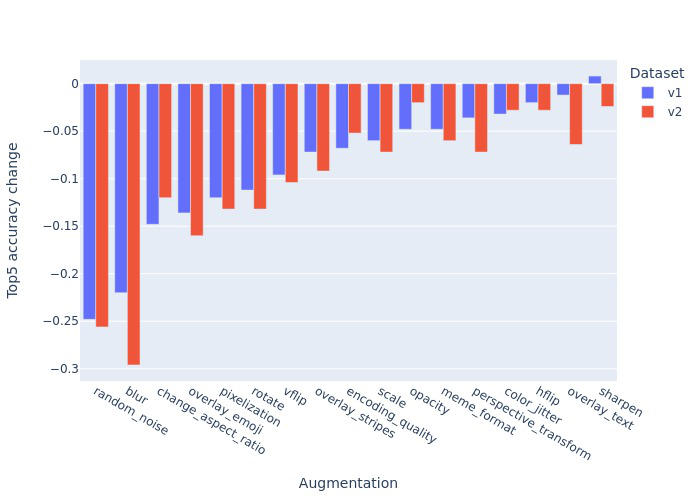

In [32]:
plot_metrics_for_model([efficient_val_df, efficient_v2_df], ["v1", "v2"], "/tmp/plot_eff.jpg")

## Resnet: top5 accuracy ∆ on Imagenet v1 vs v2

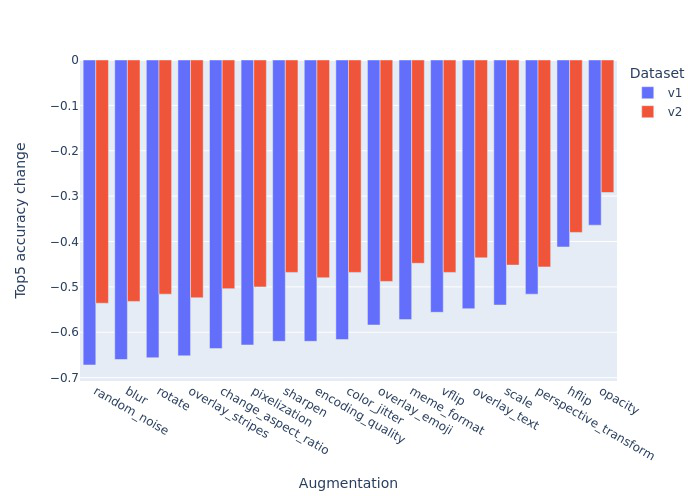

In [33]:
plot_metrics_for_model([resnet_val_df, resnet_v2_df], ["v1", "v2"], "/tmp/plot_res.jpg")

## VGG: top5 accuracy ∆ on Imagenet v1 vs v2

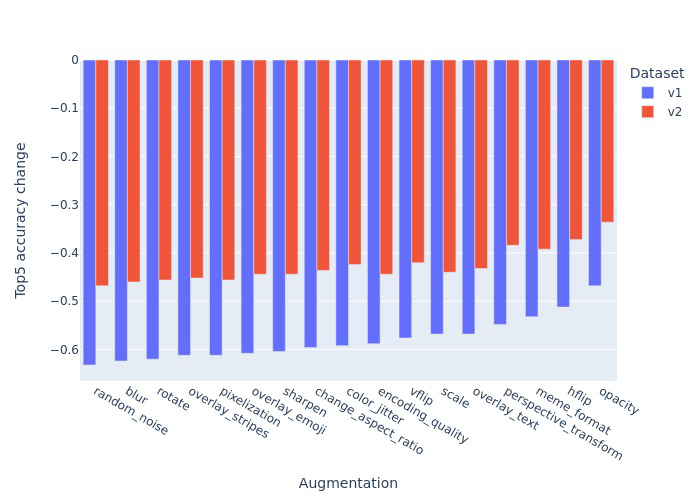

In [34]:
plot_metrics_for_model([vgg_val_df, vgg_v2_df], ["v1", "v2"], "/tmp/plot_vgg.jpg")

## Imagenet v1: top5 accuracy ∆ for VGG vs Resnet vs Efficientnet

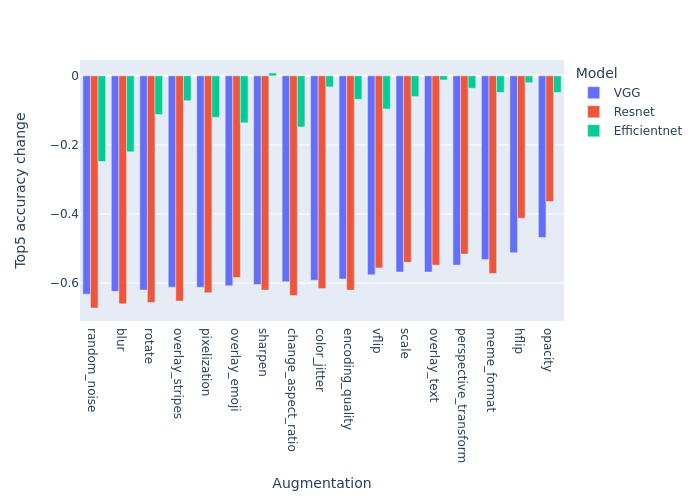

In [35]:
plot_metrics_for_dataset(
    [vgg_val_df, resnet_val_df, efficient_val_df],
    ["VGG", "Resnet", "Efficientnet"],
    "/tmp/plot_v1.jpg",
)

## Imagenet v2: top5 accuracy ∆ for VGG vs Resnet vs Efficientnet

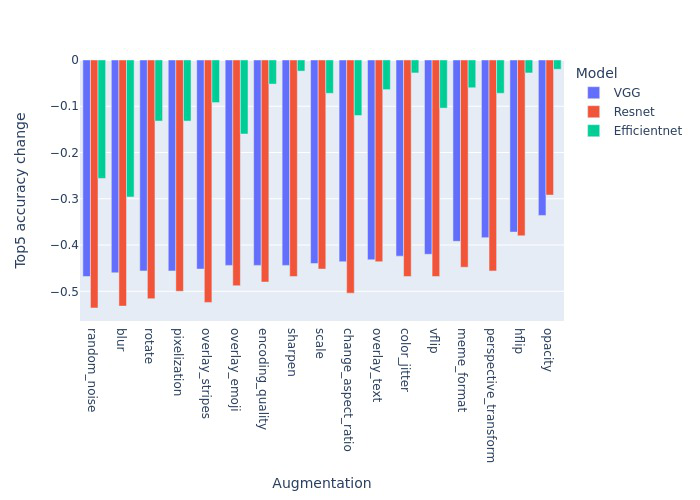

In [36]:
plot_metrics_for_dataset(
    [vgg_v2_df, resnet_v2_df, efficient_v2_df],
    ["VGG", "Resnet", "Efficientnet"],
    "/tmp/plot_v2.jpg"
)